# <div style='padding:25px;background-color:maroon;color:white;border-radius:4px;font-size:100%;text-align: center'>Banking Data Analysis<br></div>

## <span style="color:Aqua;">Importing libraries from Python</span>

In [1]:
import pandas as pd
pd.options.display.max_columns = 50
pd.set_option("display.precision", 4)
pd.set_option('display.float_format', '{:.4f}'.format)


import numpy as np
import math
from scipy.stats import pearsonr,kstest, norm, skew,kurtosis, boxcox
from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats

import seaborn as sns
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)
sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})

import matplotlib.pyplot as plt
plt.rcParams.update({
    'text.color': 'black',  # Change font color
    'axes.labelcolor': 'black',  # Change axis label color
    'xtick.color': 'black',  # Change x-tick color
    'ytick.color': 'black',  # Change y-tick color
    'font.weight': 'bold',  # Change font weight
    'axes.titleweight': 'bold',  # Change title weight
    'axes.labelweight': 'bold',# Change label weight
})


color_good = '\033[32m'   # Dark Green for near-zero skew
color_okay = '\033[92m'   # Light Green for slightly positive or slightly negative skew
color_bad = '\033[91m'    # Maroon for significant skew
color_neutral = '\033[0m' # Reset color

### <span style="color:Khaki;">Reading cleaned Dataset:

In [2]:
df=pd.read_feather('model_ready.feather')
df.sample(3)

,num_bank_accounts,num_credit_card,num_of_loan,delay_from_due_date,num_of_delayed_payment,num_credit_inquiries,credit_mix,payment_of_min_amount,payment_behaviour,credit_score,Mortgage Loan,Home Equity Loan,Credit-Builder Loan,Payday Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Auto Loan,credit_inquiry_per_loan,age_group,disposable_income,age_boxcox,annual_income_boxcox,monthly_inhand_salary_boxcox,interest_rate_boxcox,outstanding_debt_square,credit_utilization_ratio_log,credit_history_age_boxcox,changed_credit_limit_cube,total_emi_per_month_square,amount_invested_monthly_boxcox,monthly_balance_boxcox,credit_limit_change_rate_exp,debt_income_ratio_log,loan_income_ratio_month_boxcox,credit_utilization_per_account_boxcox,reliable_payment_boxcox,delayed_payment_ratio_boxcox,investment_to_income_ratio_square,total_credit_exposure_boxcox,credit_utilization_to_income_ratio_boxcox,savings_rate_rec,income_stability_boxcox,total_liability_boxcox,debt_paytime_log
31098,6,7,8,62,22,9.0000,0,1,5,0,1,1,1,0,1,1,1,1,1.0000,2,4476.8842,11.1894,14.5288,12.4027,6.7454,62.4249,3.2189,28.0888,-104,18.6728,7.2033,18.7573,0.8369,8.1716,1.5971,0.8155,6.0742,1.0249,0.0922,37.5674,-10.5659,117.5311,0.0227,39.4317,2.4109
61865,6,3,1,7,9,4.0000,1,2,0,1,0,0,0,0,0,1,0,0,2.0000,3,8164.9497,12.9787,15.5095,13.5196,5.7674,33.1558,3.3673,197.4983,-107,7.5745,8.7707,11.4435,0.5119,9.8971,2.0969,0.8688,0.9807,1.9001,0.0879,24.6626,-11.3298,129.3244,-0.0070,25.3276,2.9356
98199,10,8,9,46,19,13.0000,0,2,1,0,1,0,1,1,1,0,1,0,2.0000,2,1006.5204,10.9532,12.3655,9.5803,5.7674,50.2020,3.6376,79.9008,8,10.4411,5.4497,17.3539,0.4320,6.7550,1.4868,0.8027,3.5769,0.7077,0.1438,32.5804,-7.6448,48.3479,-0.1334,33.5664,3.1315


## <span style="color:Aqua;">Defining variable type</span> 

In [3]:
continuous = [
    'age_boxcox','annual_income_boxcox','monthly_inhand_salary_boxcox','interest_rate_boxcox','outstanding_debt_square',
    'credit_utilization_ratio_log','credit_history_age_boxcox','changed_credit_limit_cube','total_emi_per_month_square',
    'amount_invested_monthly_boxcox','monthly_balance_boxcox','credit_limit_change_rate_exp','debt_income_ratio_log',
    'loan_income_ratio_month_boxcox','credit_utilization_per_account_boxcox','reliable_payment_boxcox','delayed_payment_ratio_boxcox',
    'investment_to_income_ratio_square','total_credit_exposure_boxcox','credit_utilization_to_income_ratio_boxcox',
    'savings_rate_rec','income_stability_boxcox','total_liability_boxcox','debt_paytime_log'
]

categorical = ['num_bank_accounts' ,'num_credit_card', 'num_of_loan','delay_from_due_date',
               'num_of_delayed_payment','num_credit_inquiries','credit_mix','payment_of_min_amount',
               'payment_behaviour','credit_score','credit_inquiry_per_loan','age_group',]

In [4]:
print(len(continuous) ,'+',  len(categorical),len(continuous) + len(categorical))
print(df.shape[1] - 8) # removing 8 binary columns

24 + 12 36
37


## <p style="color:Aqua;"> Exploratory Data Analysis. After Handling Skewness, Kurtosis and Outliers</p>

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to create plots.</span></span><br>

In [13]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]
    sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})
    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=50,color='maroon',fill=True)
    plt.title(f'Histogram for {col}',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)

    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to show Kurtosis and Skewness value.</span></span><br>

In [14]:
def kurtosis_color(kurt_val):
    if -1 <= kurt_val <= 1:
        kurt_color = color_good  # Dark Green for near-zero kurtosis (good)
    elif 1 < kurt_val <= 3 or -3 <= kurt_val < -1:
        kurt_color = color_okay  # Yellow for moderate kurtosis
    else:  # kurt_val > 3 or kurt_val < -3
        kurt_color = color_bad  # Maroon for extreme kurtosis
    return kurt_color

def skewness_color(skew_val):
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
    return color

### <span style="color:Khaki;">Ploting Continuous features Distribution:

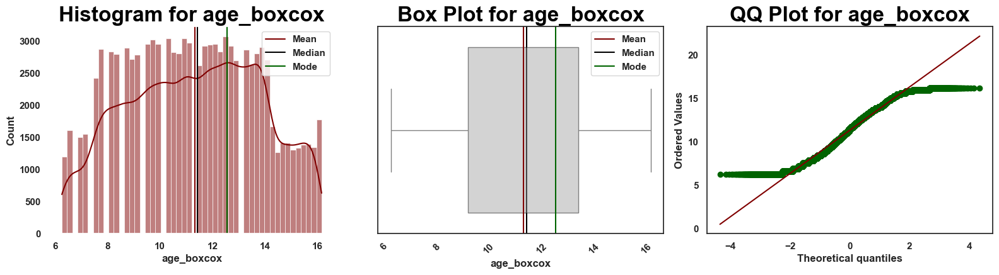



Skew for age_boxcox is -0.0644
Kurtosis for age_boxcox is -0.9414




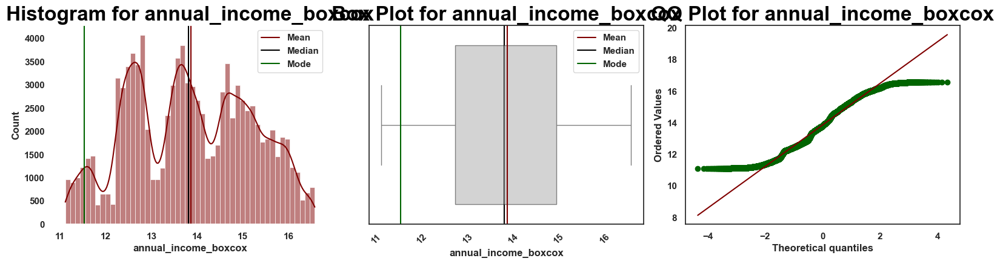



Skew for annual_income_boxcox is -0.0121
Kurtosis for annual_income_boxcox is -0.9303




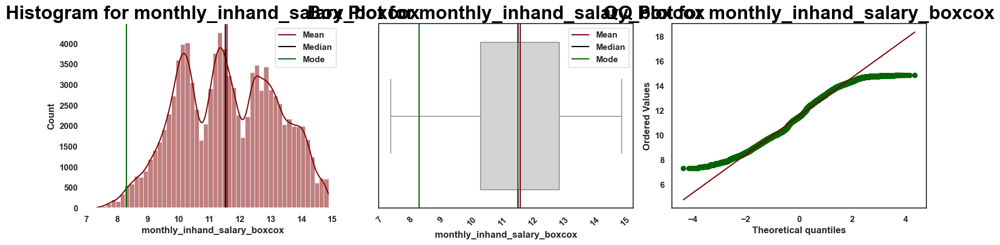



Skew for monthly_inhand_salary_boxcox is -0.0189
Kurtosis for monthly_inhand_salary_boxcox is -0.8420




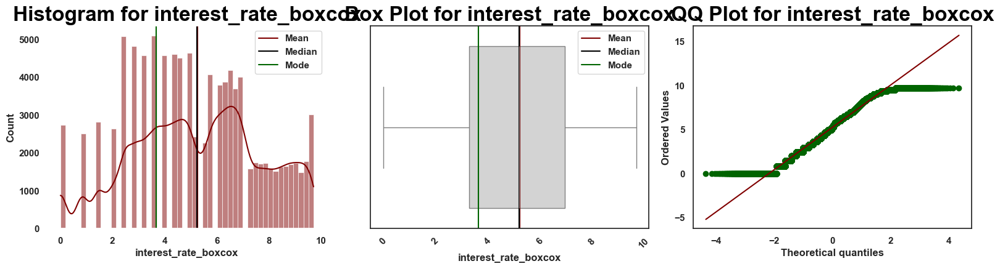



Skew for interest_rate_boxcox is -0.0995
Kurtosis for interest_rate_boxcox is -0.7226




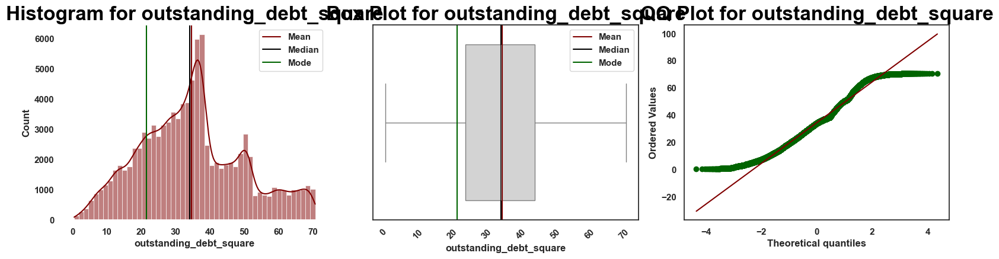



Skew for outstanding_debt_square is 0.3148
Kurtosis for outstanding_debt_square is -0.3422




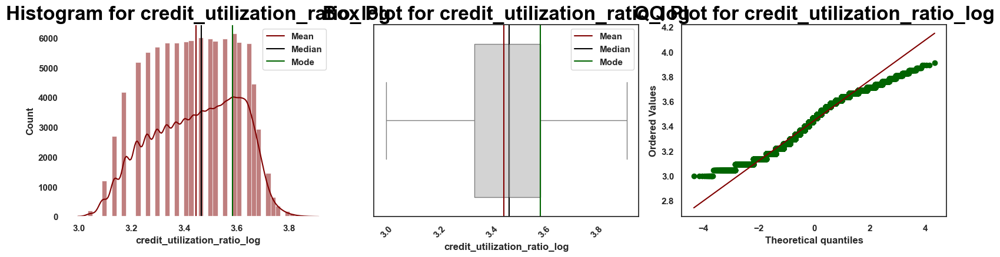



Skew for credit_utilization_ratio_log is -0.2286
Kurtosis for credit_utilization_ratio_log is -0.8973




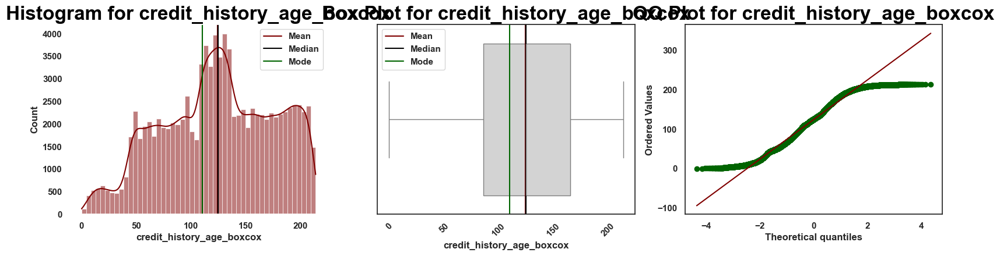



Skew for credit_history_age_boxcox is -0.1716
Kurtosis for credit_history_age_boxcox is -0.8043




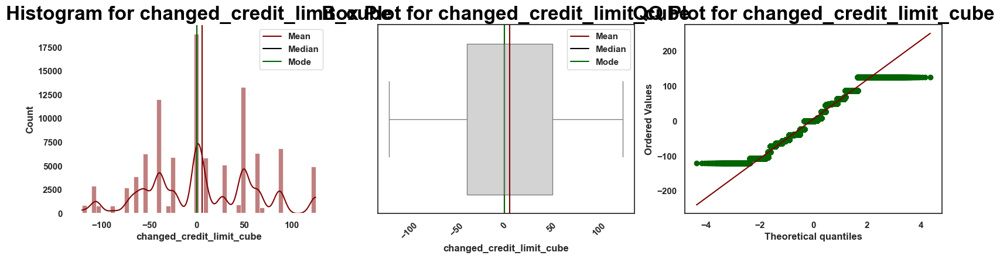



Skew for changed_credit_limit_cube is 0.1025
Kurtosis for changed_credit_limit_cube is -0.5185




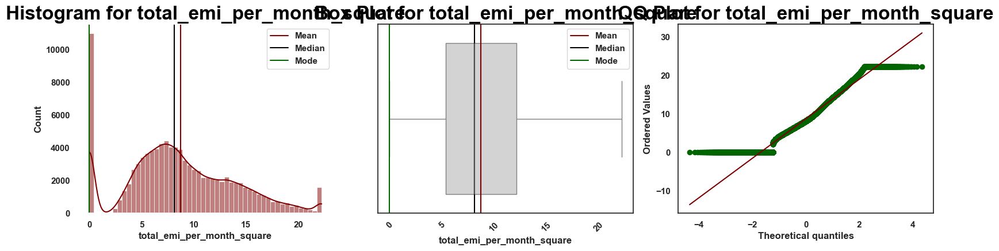



Skew for total_emi_per_month_square is 0.3232
Kurtosis for total_emi_per_month_square is -0.1932




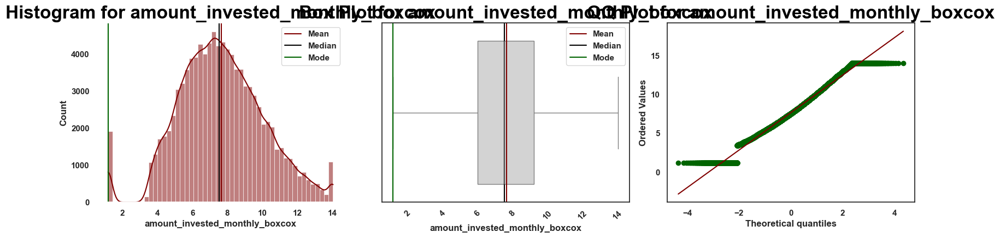



Skew for amount_invested_monthly_boxcox is 0.1273
Kurtosis for amount_invested_monthly_boxcox is 0.1684




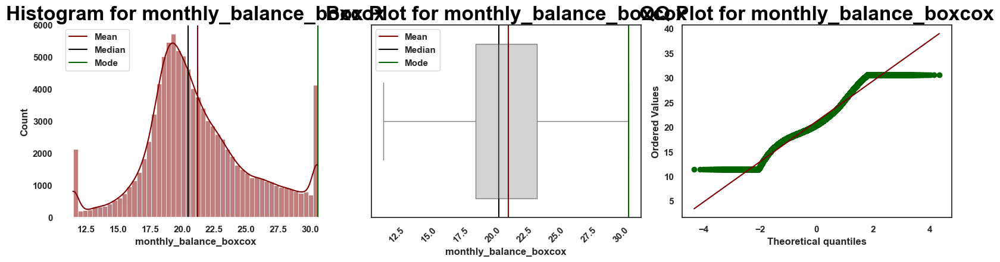



Skew for monthly_balance_boxcox is 0.3887
Kurtosis for monthly_balance_boxcox is 0.1282




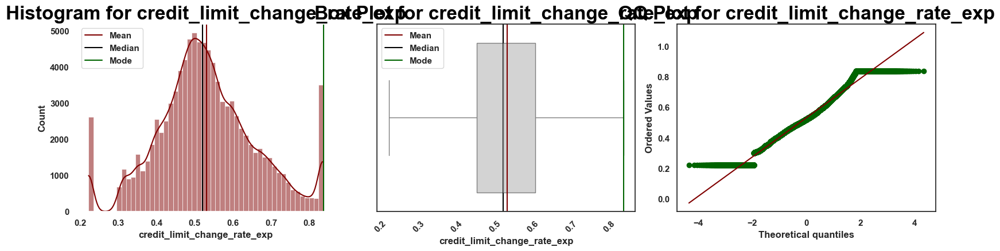



Skew for credit_limit_change_rate_exp is 0.2125
Kurtosis for credit_limit_change_rate_exp is 0.1741




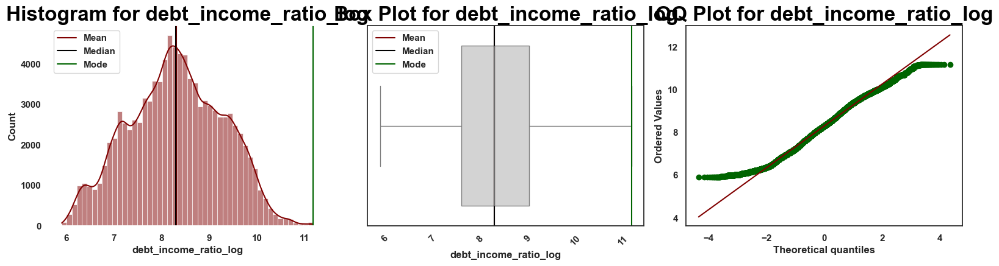



Skew for debt_income_ratio_log is -0.0169
Kurtosis for debt_income_ratio_log is -0.5630




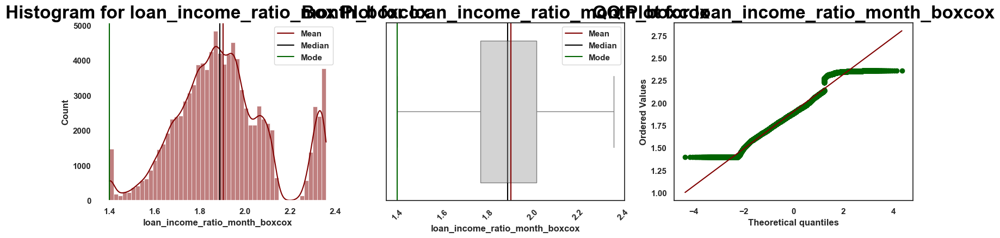



Skew for loan_income_ratio_month_boxcox is 0.3175
Kurtosis for loan_income_ratio_month_boxcox is 0.0270




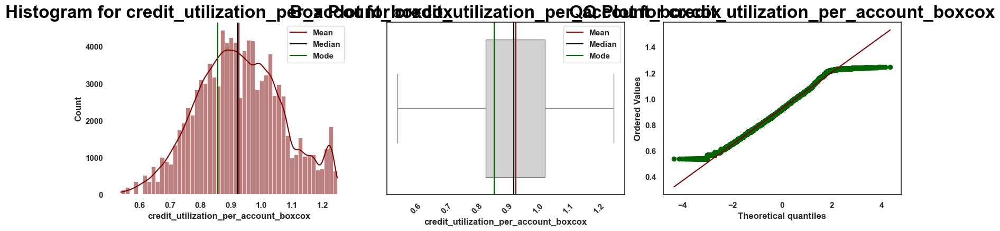



Skew for credit_utilization_per_account_boxcox is 0.0780
Kurtosis for credit_utilization_per_account_boxcox is -0.3449




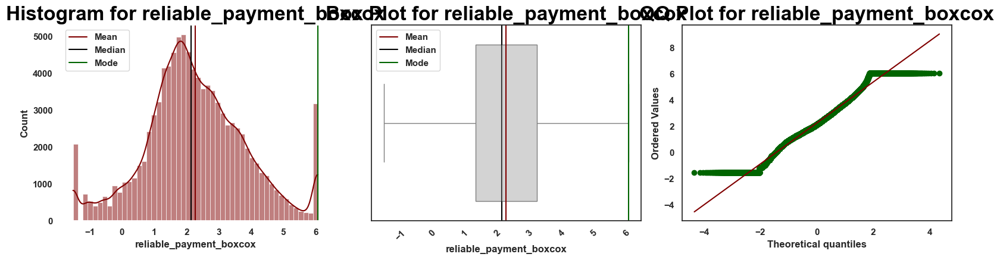



Skew for reliable_payment_boxcox is 0.1346
Kurtosis for reliable_payment_boxcox is 0.2440




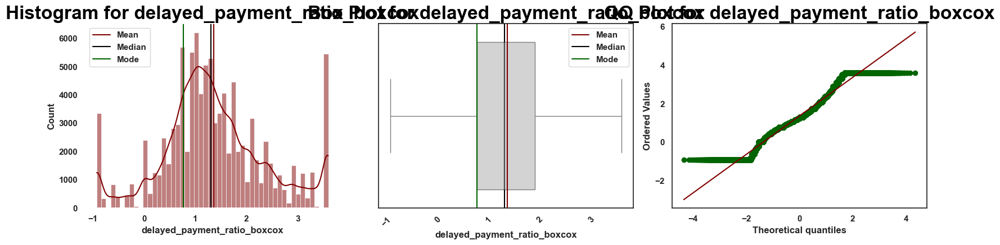



Skew for delayed_payment_ratio_boxcox is 0.2182
Kurtosis for delayed_payment_ratio_boxcox is 0.1666




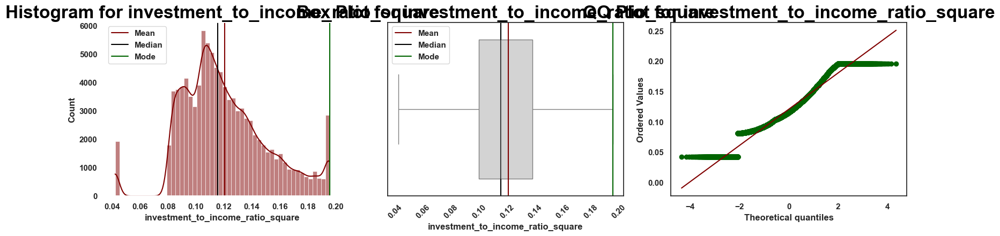



Skew for investment_to_income_ratio_square is 0.4563
Kurtosis for investment_to_income_ratio_square is 0.2799




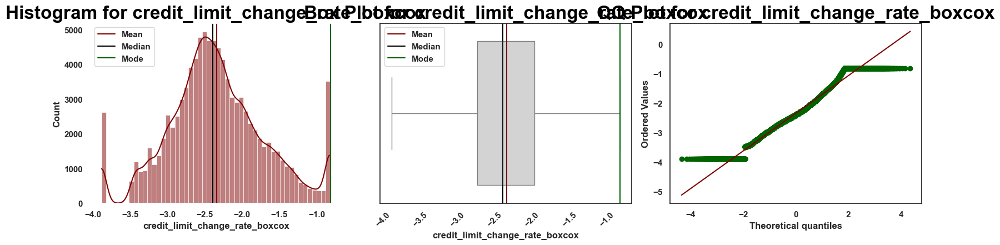



Skew for credit_limit_change_rate_boxcox is 0.2139
Kurtosis for credit_limit_change_rate_boxcox is 0.1746




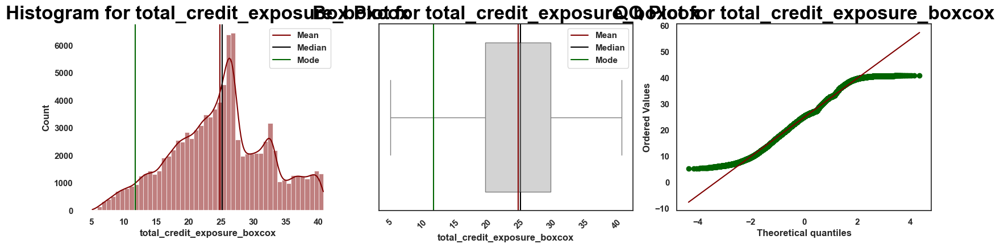



Skew for total_credit_exposure_boxcox is -0.0422
Kurtosis for total_credit_exposure_boxcox is -0.3925




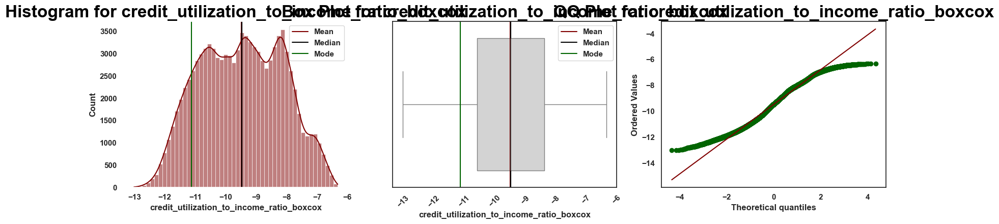



Skew for credit_utilization_to_income_ratio_boxcox is 0.0177
Kurtosis for credit_utilization_to_income_ratio_boxcox is -0.8778




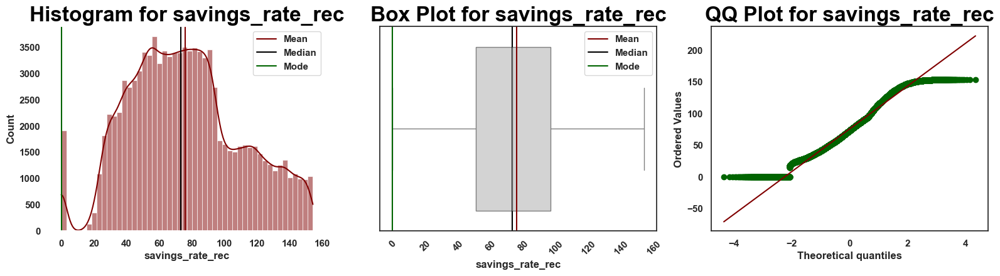



Skew for savings_rate_rec is 0.2769
Kurtosis for savings_rate_rec is -0.4697




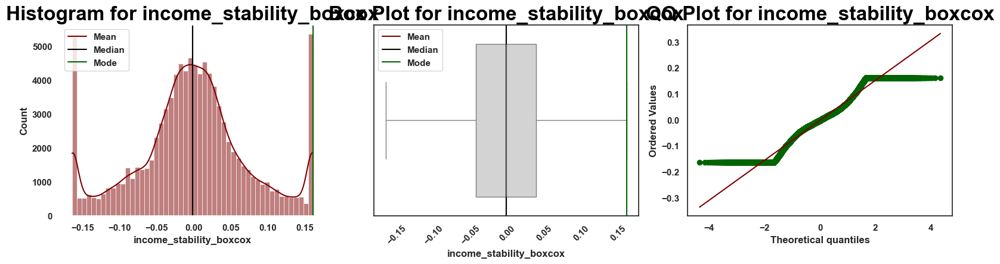



Skew for income_stability_boxcox is -0.0063
Kurtosis for income_stability_boxcox is 0.0154




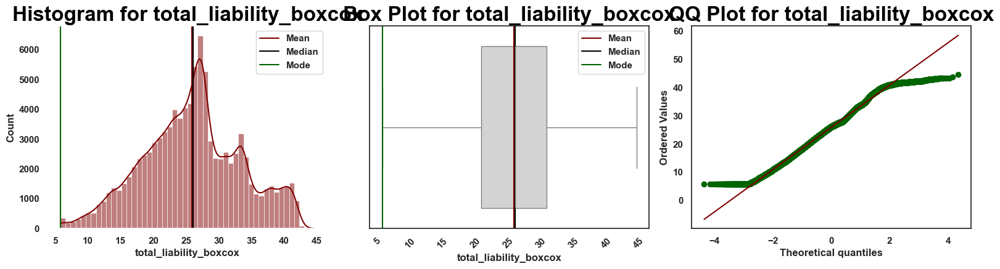



Skew for total_liability_boxcox is -0.0139
Kurtosis for total_liability_boxcox is -0.3242




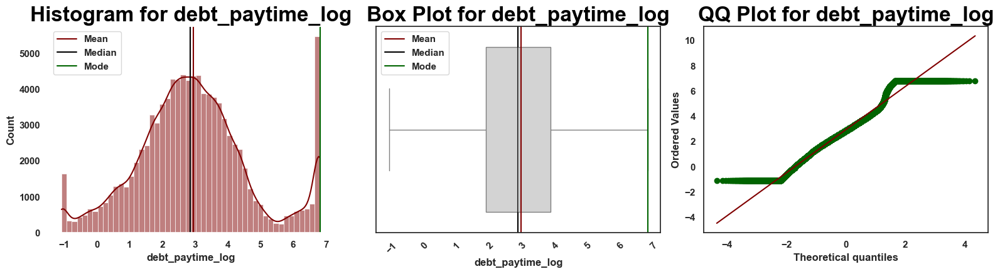



Skew for debt_paytime_log is 0.2916
Kurtosis for debt_paytime_log is 0.1993




In [15]:
skewed_col = []


for i in continuous:
    univar_num(df,i) 
    skew_val = df[i].skew()
    kurt=df[i].kurtosis()
    kurt_color = kurtosis_color(kurt)
    color = skewness_color(skew_val)
    skewed_col.append(i)

    print(f"\n\n{color}Skew for {i} is {skew_val:.4f}{color_neutral}")
    print(f"{color}Kurtosis for {i} is {kurt:.4f}{color_neutral}\n\n")

### <span style="color:Khaki;">Categorical features Distribution

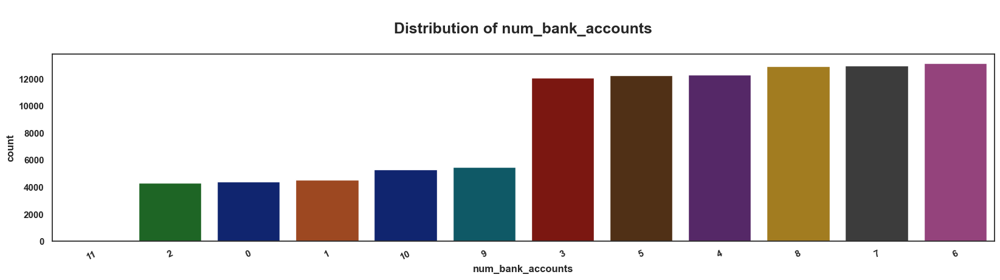

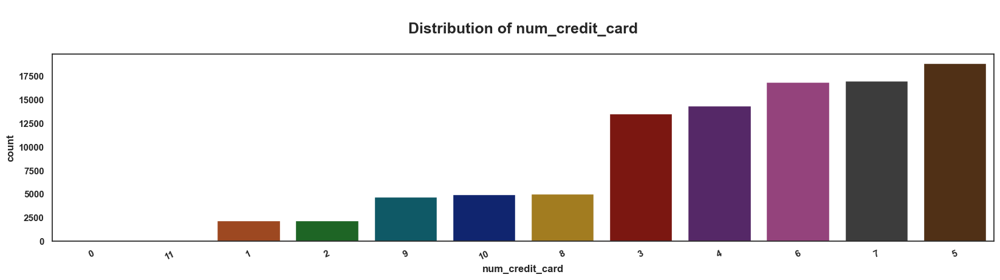

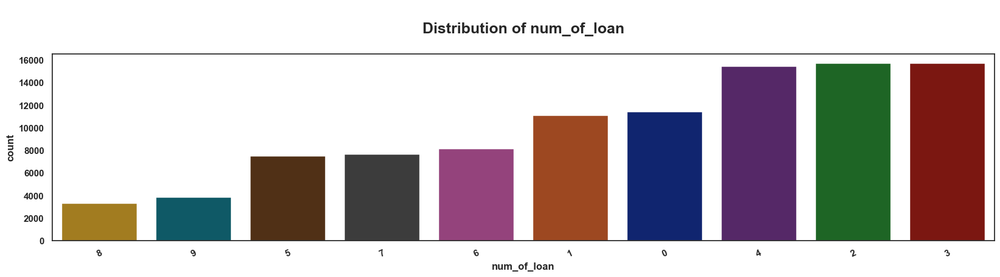

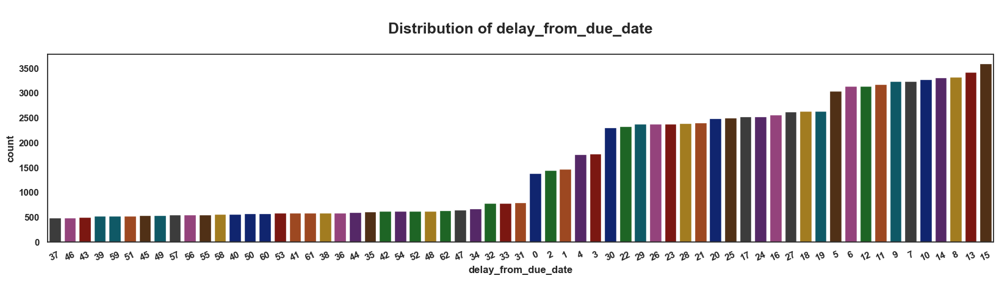

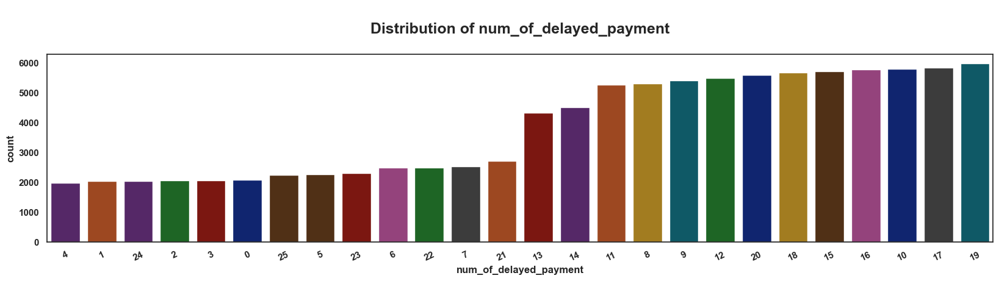

...

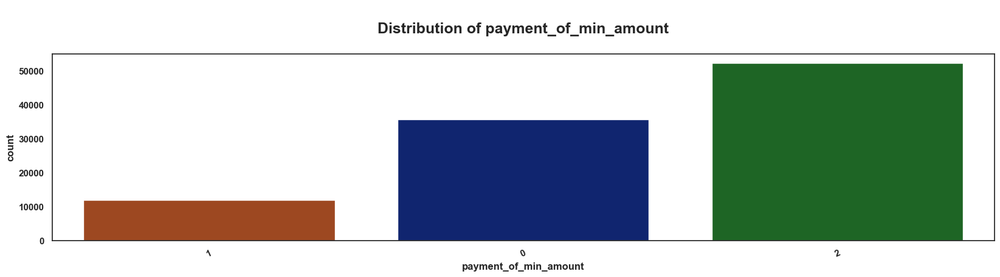

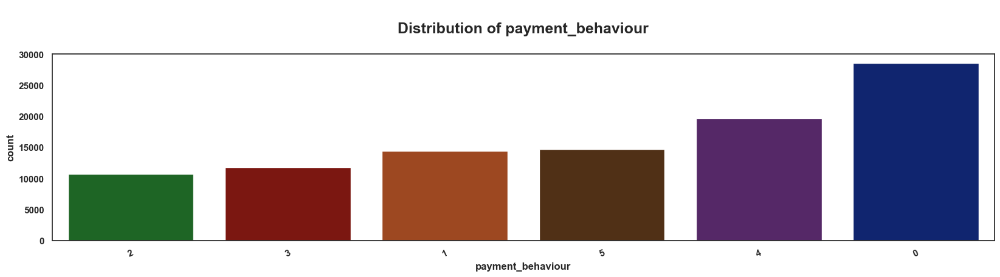

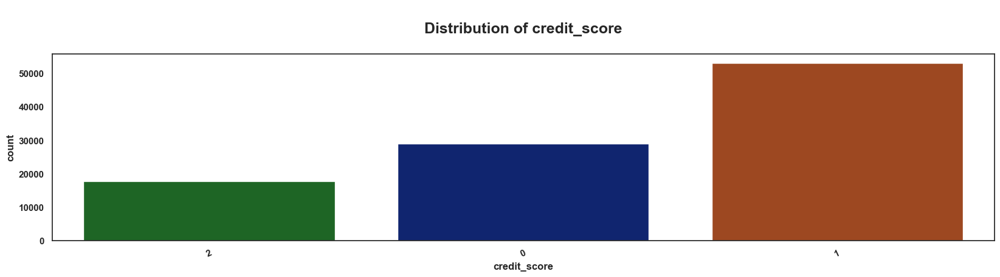

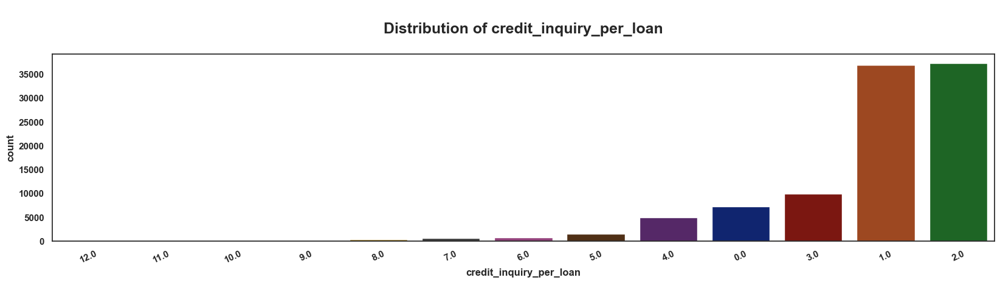

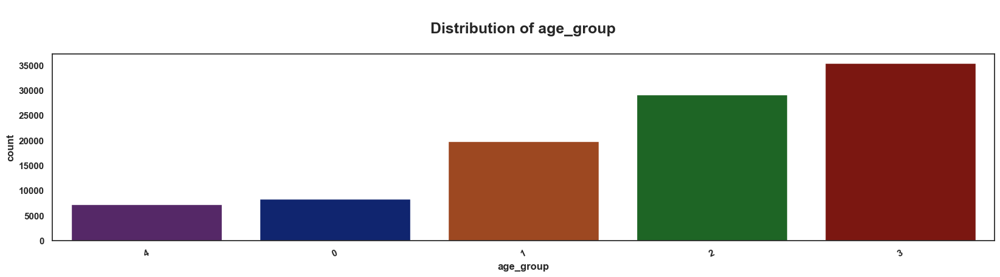

In [19]:
for i in categorical:
    plt.figure(figsize=(20, 4))
    sns.countplot(data=df, x=df[i], hue=i, order = df[i].value_counts().index.tolist()[::-1],palette='dark',legend=False)
    plt.title(f"\nDistribution of {i}\n",fontdict={'fontsize':18,'fontweight':'bold'})
    plt.xticks(rotation=25)
plt.show()

### <span style="color:Khaki;"> Relationship Categorical Variables VS Credit Score:</span>

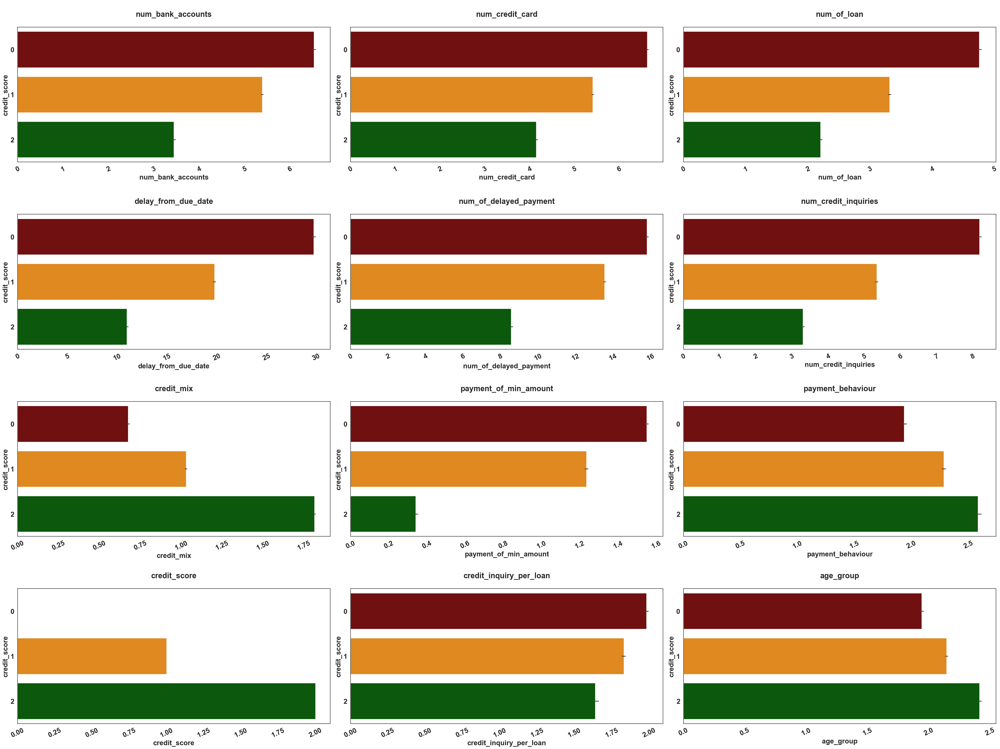

In [20]:
fig, axes = plt.subplots(ncols=3, nrows = int(np.ceil(len(categorical)/3)), figsize=(40, 30))

for i, col in enumerate(categorical):
    if i != 'credit_score':
        sns.barplot(data=df, x=col, y='credit_score', hue="credit_score",hue_order=[2,1,0],orient='h',palette=['DarkGreen','darkorange','maroon'], legend=False,ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(f"\n{col}\n", weight='bold', fontsize=22)  # Explicitly set title font weight and size
        axes[i//3, i%3].tick_params(axis='x', rotation=25, labelsize=20)  # Set xtick label size
        axes[i//3, i%3].tick_params(axis='y', labelsize=20)  # Set ytick label size
        axes[i//3, i%3].set_xlabel(col, fontsize=20, weight='bold')  # Set xlabel size and weight
        axes[i//3, i%3].set_ylabel('credit_score', fontsize=20, weight='bold')  # Set ylabel size and weight
    
plt.tight_layout()
plt.show()

### <span style="color:Khaki;"> Relationship Numerical Variables VS Credit Score:</span>

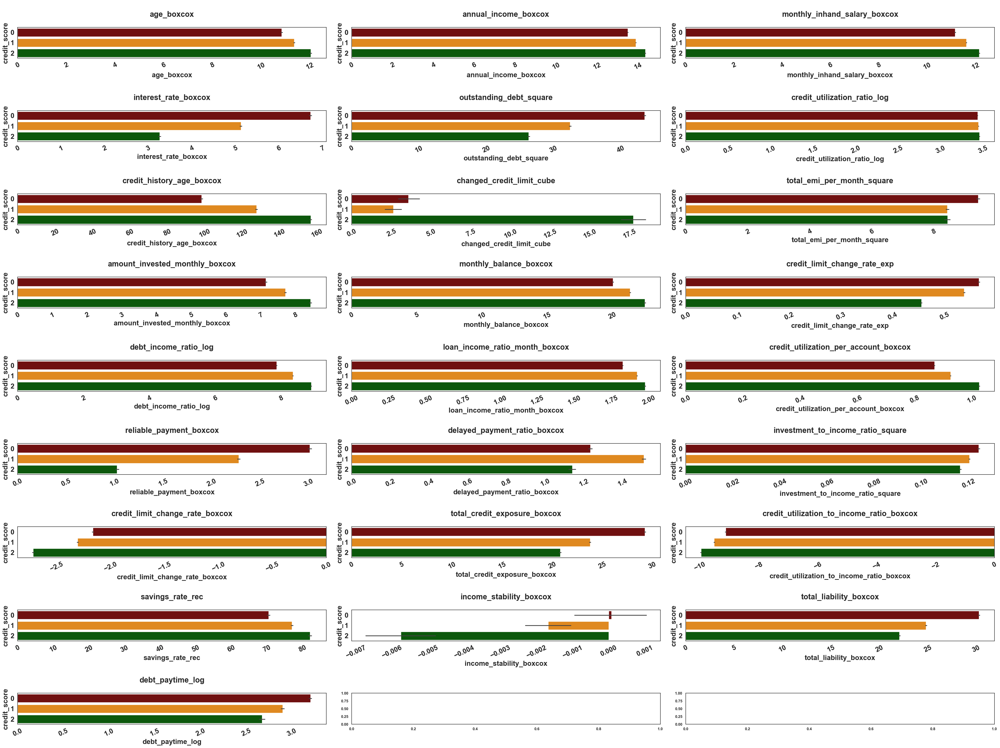

In [21]:
fig, axes = plt.subplots(ncols=3, nrows = int(np.ceil(len(continuous)/3)), figsize=(40, 30))


for i, col in enumerate(continuous):
    if i != 'credit_score':
        sns.barplot(data=df, x=col, y='credit_score', hue="credit_score",hue_order=[2,1,0],orient='h',palette=['DarkGreen','darkorange','maroon'], legend=False,ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(col,fontdict={'fontsize':20,'fontweight':'bold'})
        axes[i//3, i%3].tick_params(axis='x', rotation=25)
        axes[i//3, i%3].set_title(f"\n{col}\n", weight='bold', fontsize=22)  # Explicitly set title font weight and size
        axes[i//3, i%3].tick_params(axis='x', rotation=25, labelsize=20)  # Set xtick label size
        axes[i//3, i%3].tick_params(axis='y', labelsize=20)  # Set ytick label size
        axes[i//3, i%3].set_xlabel(col, fontsize=20, weight='bold')  # Set xlabel size and weight
        axes[i//3, i%3].set_ylabel('credit_score', fontsize=20, weight='bold')  # Set ylabel size and weight
    
plt.tight_layout()
plt.show()

### <p Style="color: Khaki">Correlation - Pearson's and Spearman's </p>

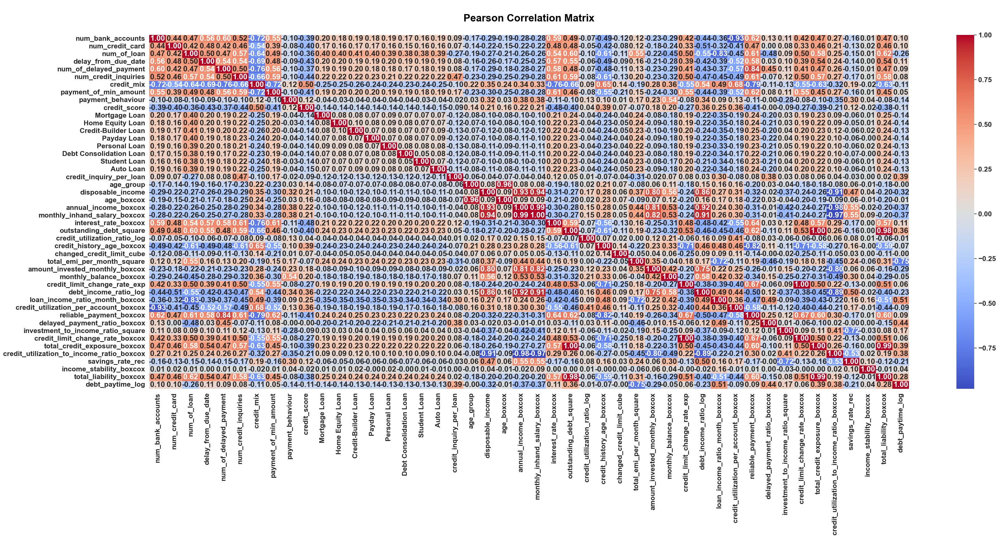

In [24]:
sns.set_theme(font_scale=1.5)

cor_col = df.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(40,15))

sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('\nPearson Correlation Matrix\n',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})
plt.show()

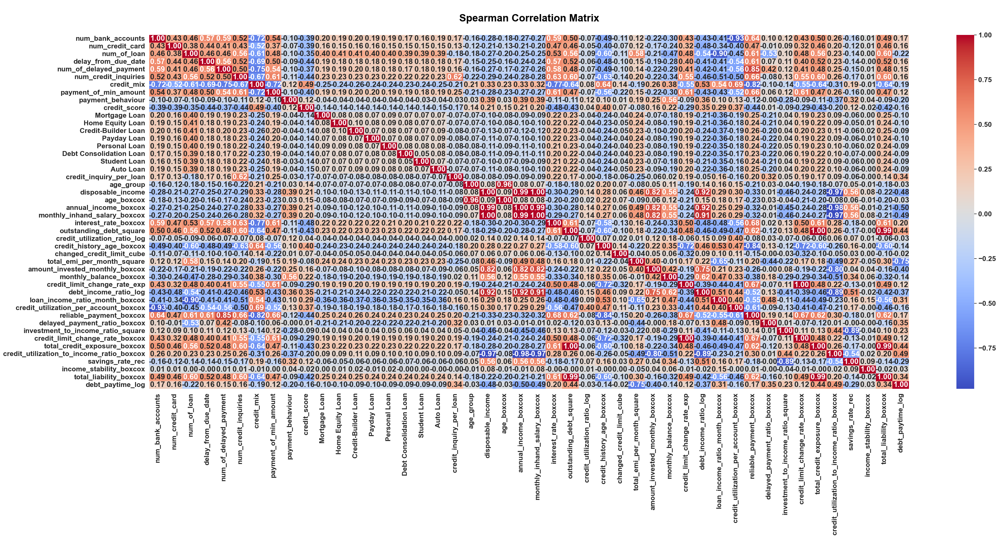

In [25]:
plt.figure(figsize=(40,15))

cor_col = df.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('\nSpearman Correlation Matrix\n',fontdict={'fontsize':24,'color':'black','fontweight':'bold'})

plt.show()

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 46 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   num_bank_accounts                          100000 non-null  int8   
 1   num_credit_card                            100000 non-null  int8   
 2   num_of_loan                                100000 non-null  int8   
 3   delay_from_due_date                        100000 non-null  int8   
 4   num_of_delayed_payment                     100000 non-null  int8   
 5   num_credit_inquiries                       100000 non-null  float64
 6   credit_mix                                 100000 non-null  int8   
 7   payment_of_min_amount                      100000 non-null  int8   
 8   payment_behaviour                          100000 non-null  int8   
 9   credit_score                               100000 non-null  int8   
 10  Mortgage 